In [557]:
"""
Created By    : Joshua Kern
Creation Date : 30 November 2022
Course        : ATSC 528 - Atmospheric Data Analysis
Assignment    : #03 - Statistical Objective Analysis

Purpose:
Script to take sparse upper air observations and analyze them on a
polar stereographic map projection using statistical objective analysis.

This lab is a Univariate Statistical Objective Analysis of height data utilizing a polar stereographic projection. 
First, the code calculates the background field to perform the analysis. The background field is calculated from a 
one pass Barnes analysis (forward interpolation) to find the background at the observation points. Next, forward 
interpolation is performed at the observation stations so we can find the background at the observation stations. 
The lab then calculates the observation increments for the observations based on background. Next, a correlation matrix
for background error is created (observation points closest to the analysis point). Background error is calculated for 
the difference between the observation points and the analysis points. Then the matrix is multiplied with the background
error and it creates weights. The weights are applied to the observation increments and used to find analysis value as 
well as the analysis background for the number of desirable observation points. The code solves for and plots N=2, N=4,
N=10 (number of closest points included in analysis) and analyses increments. Lastly, it calculates then plots the analysis 
differences as well as the RMS between the analysis and observation stations.
"""
__author__    = "Jared W. Marquis"
__contact__   = "jared.marquis@und.edu"

In [3]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 
import matplotlib.pyplot as plt    
import cartopy.crs as ccrs         
import cartopy.feature as cfeature 
import pandas as pd

In [4]:
#define global variables
global map_scale
global phi_latitude
global range_factor
global K_d
global r_e

In [5]:
#define constants and set equations for
K_d = 10.8844524
r_e = 12.7775892
phi_latitude = 60 * (np.pi/180)
range_factor = ((1+np.sin(40*(np.pi/180)))/(1+np.sin(phi_latitude))) * -1.24

In [6]:
### function for bilinear interpolation ###
def bilinear_interpolation(observationx, observationy, a_obs):
    
    indexx = ((observationx - x_knot) / delx)
    indexy = ((observationy - y_knot) / delx)   
    matrix = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    i = (indexx - np.floor(indexx))
    j = (indexy - np.floor(indexy))
    indexx = int(np.floor(indexx))
    indexy = int(np.floor(indexy))
    matrix_a = np.matrix([1, i, j, i*j]).T
    matrix_o = np.matrix([a_obs[indexy, indexx],
            a_obs[indexy,indexx+1],
            a_obs[indexy+1,indexx],
             a_obs[indexy+1,indexx+1]])
    
    return matrix_o * matrix * matrix_a

In [7]:
#create method for barnes to get the background field for analysis
def barney(xx, yy, fknot):
    weights = np.empty(len(xx))
    for i in range(len(xx)):
        distk = (xx[i]**2 + yy[i]**2)**0.5
        weight = np.exp((-distk**2)/K_d)
        weights[i] = weight
    return (np.nansum(weights*fknot)/np.sum(weights))

In [8]:
#create method for the bilinear interpolation for first pass finding observations for BG
def define_background_observations(radius_influence):
    
    for i in range(len(heights_500mb)):
        if x_ob[i] > np.amin(xx) and \
            x_ob[i] < np.amax(xx) and \
            y_ob[i] > np.amin(yy) and \
            y_ob[i] < np.amax(yy):
                bg_obs[i] = bilinear_interpolation(x_ob[i], y_ob[i], background_analysis[:,:])
        else: 
            radian = ((x_ob[i]-xx)**2 + (y_ob[i]-yy)**2)**0.5
            if np.min(radian) > radius_influence:
                bg_obs[i] = np.nan
            
            else:
                indexes_roiis = np.where(radian <= radius_influence)
                relative_xb = (x_ob[i] - xx[indexes_roiis]).flatten()
                relative_yb = (y_ob[i] - yy[indexes_roiis]).flatten()
                hts = (background_analysis[:,:][indexes_roiis]).flatten()
                bg_obs[i] = barney(relative_xb, relative_yb, hts)              

In [9]:
#find the differences of analysis values for obs stations. Then we find the analysis at the observation stations 
def analysis_at_stations(num_N, analysis_array):
    
    for i in range(len(heights_500mb)):
        if x_ob[i] > np.amin(xx) and \
            x_ob[i] < np.amax(xx) and \
            y_ob[i] > np.amin(yy) and \
            y_ob[i] < np.amax(yy):
                analysis_at_observations[i, num_N] = bilinear_interpolation(x_ob[i], y_ob[i], analysis_array[:,:,num_N])
        else:
            radian = ((x_ob[i]-xx)**2 + (y_ob[i]-yy)**2)**0.5
            if np.min(radian) > r_e:
                analysis_at_observations[i, num_N] = np.nan
            else:
                indexes_roiis = np.where(radian <= r_e)
                relative_xb = (x_ob[i] - xx[indexes_roiis]).flatten()
                relative_yb = (y_ob[i] - yy[indexes_roiis]).flatten()
                hts = (analysis_array[:,:,num_N][indexes_roiis]).flatten()
                analysis_at_observations[i, num_N] = barney(relative_xb, relative_yb, hts)

In [10]:
#create function that finds the background error correlation between the stations
def background_error_correlation(N, xx, yy, observation_indexes):
    matrix = np.zeros([N, N])
    
    #find the distance between the x,y point at analysis point. Calculate correlation
    for i in range(N):
        for j in range(N):
            difference_x = xx[observation_indexes[j]] - xx[observation_indexes[i]]
            difference_y = yy[observation_indexes[j]] - yy[observation_indexes[i]]
            s = (difference_x**2 + difference_y**2) **0.5
            world = s / map_scale
            unit_conv_globe = (world)/(1000*1000*100)
            rho_scale = 0.95*np.exp((range_factor*(unit_conv_globe**2)))
            if rho_scale == 0.95:
                matrix[i,j] = 1
            else:
                matrix[i,j] = rho_scale
    return np.linalg.inv(np.matrix(matrix))


In [11]:
#Define a method to create the 1-D background error correlation for the distance between observations and grid
def background_error_grid(N, xx, yy, pt_x, pt_y, observation_indexes):
    matrix2 = np.zeros([N])
    
    #compute the distance between the grid point at i,j and the N closest xs. This is in 1000's of kms on the globe.
    for i in range(N):
        difference_x = xx[observation_indexes[i]] - pt_x
        difference_y = yy[observation_indexes[i]] - pt_y
        s = (difference_x**2 + difference_y**2)**0.5
        world = s / map_scale
        unit_conv_globe = (world)/(1000*1000*100)
        rho_scale = 0.95*np.exp((range_factor*(unit_conv_globe**2)))
        matrix2[i] = rho_scale
    
    return np.matrix(matrix2)


In [12]:
### Read in observations ###
df = pd.read_csv("./RAOBs_201903131200.txt", sep=",", names = ["Station ID","Latitude", "Longitude", "500 mb Height (m)", "500 mb Wind Direction", "500 mb Wind Speed(knots)"])
longitude = df["Longitude"]
latitude = df["Latitude"]
heights_500mb = df["500 mb Height (m)"]
df.head()

,Station ID,Latitude,Longitude,500 mb Height (m),500 mb Wind Direction,500 mb Wind Speed(knots)
0,CWPL,51.47,-90.2,5460.0,285.0,29.0
1,CWQI,43.83,-66.0,5540.0,325.0,41.0
2,CWSE,53.55,-113.9,5360.0,280.0,12.0
3,CYAH,53.75,-73.6,5340.0,300.0,70.0
4,CYBK,64.30,-96.0,5220.0,95.0,17.0


In [13]:
### Set up analysis map with a 22x28 rectangular grid of points ###
delx = 1.27
dely = 1.27
x_knot = 18.90
y_knot = -6.3
x_n = 22
y_n = 28

### convert obs lat/long to x,y ###
radius_earth = 6371 * 1e5
#phi_latitude = 60 * (np.pi/180)
map_scale = 1/(15e6)
lambda_longitude = -115

#constants                            
sigma = (1 + np.sin(phi_latitude))/(1 + np.sin((latitude * (np.pi/180))))
r = radius_earth * sigma * (np.cos(latitude * (np.pi/180))) * map_scale
y_ob = r * np.sin(((longitude * (np.pi/180)) - (lambda_longitude * (np.pi/180))))
x_ob = r * np.cos(((longitude * (np.pi/180)) - (lambda_longitude * (np.pi/180))))


### Set up analysis map with a 22x28 rectangular grid of points ###
xstep = 18.9 + np.arange(22)*(1.27)                       #set x step
ystep = -6.3 + np.arange(28)*(1.27)                       #set y step
xx,yy = np.meshgrid(xstep, ystep)                        #set grid points

In [14]:
#define x2lon and y2lat
x2lon = np.arctan(yy/xx) * (180/np.pi) + lambda_longitude
y2lat = (180/np.pi) * ((np.pi/2) - (2*np.arctan(np.sqrt((xx/map_scale)**2+(yy/map_scale)**2)/(radius_earth*(1+np.sin(phi_latitude))))))

In [15]:
#set empty arrays to store values
bg_obs = np.empty((len(heights_500mb)))
background_analysis = np.empty((y_n, x_n))
analysis_increments = np.empty((y_n, x_n, 3))
analysis_at_observations = np.empty((len(heights_500mb), 3))
analysis_difference = np.empty((len(heights_500mb), 3))
analysis_array = np.empty((y_n, x_n, 3))

In [16]:
#Calc 1st analysis background of analysis grid with the rawinsonde data and the radius of influence
for i in range(len(xx)):
    for j in range(len(xx[0])):
        relative_x = xx[i, j] - x_ob
        relative_y = yy[i, j] - y_ob
        relative_rad = (relative_x**2 + relative_y**2) **0.5
        index_rois = np.where(relative_rad<r_e)[0]
        x_k = relative_x[index_rois].values
        y_k = relative_y[index_rois].values
        fknot = heights_500mb[index_rois].values            
        background_analysis[i, j] = barney(x_k, y_k, fknot)

In [17]:
#establish the ob bg field
define_background_observations(r_e)

#get increments for obs
obs_incs = heights_500mb - bg_obs

In [18]:
#set N values to analyze/find closest stations
n_vals = [2,4,10]

for n in range(len(n_vals)):
    N = n_vals[n]
    for i in range (len(xx)):
        for j in range(len(xx[0])):
            relative_x = xx[i, j] - x_ob
            relative_y = yy[i, j] - y_ob
            relative_rad = (relative_x**2 + relative_y**2) **0.5
            observ = np.argsort(relative_rad)[0:N]
            #now calc analysis value
            x_k = x_ob[observ]
            y_k = y_ob[observ]
            hts = obs_incs[observ]
            matrix = background_error_correlation(N, x_k, y_k, observ)
            rhovector = background_error_grid(N, x_k, y_k, xx[i,j], yy[i,j], observ) 
            weights = rhovector*matrix
            values = np.empty([N])
            for k in range(N):
                values[k] = weights[0,k] * obs_incs[observ[k]]
            analysis_array[i,j,n] = background_analysis[i,j] + (np.sum(values))
    analysis_at_stations(n, analysis_array)

In [19]:
analysis_at_observations[0,0]

5458.667139687739

In [20]:
#analysis increments 
analysis_increments[:,:,0] = analysis_array[:,:,0] - background_analysis[:,:]
analysis_increments[:,:,1] = analysis_array[:,:,1] - background_analysis[:,:]
analysis_increments[:,:,2] = analysis_array[:,:,2] - background_analysis[:,:]
#analysis differences
analysis_difference[:,0] = analysis_at_observations[:,0] - heights_500mb
analysis_difference[:,1] = analysis_at_observations[:,1] - heights_500mb
analysis_difference[:,2] = analysis_at_observations[:,2] - heights_500mb

In [21]:
#rms vals
rmsvalue_sum1 = (analysis_at_observations[:,0] - heights_500mb)**2
rmsvalue_sum1 = rmsvalue_sum1[~np.isnan(rmsvalue_sum1)]
rmsvalue_sum2 = (analysis_at_observations[:,1] - heights_500mb)**2
rmsvalue_sum2 = rmsvalue_sum2[~np.isnan(rmsvalue_sum2)]
rmsvalue_sum3 = (analysis_at_observations[:,2] - heights_500mb)**2
rmsvalue_sum3 = rmsvalue_sum3[~np.isnan(rmsvalue_sum3)]

rmsval1 = np.sqrt((np.sum(rmsvalue_sum1))/len(rmsvalue_sum1))
print(rmsval1)
rmsval2 = np.sqrt((np.sum(rmsvalue_sum2))/len(rmsvalue_sum2))
print(rmsval2)
rmsval3 = np.sqrt(np.sum(rmsvalue_sum3)/len(rmsvalue_sum3))
print(rmsval3)

51.91923052583756
49.9606106745324
50.97242487632018


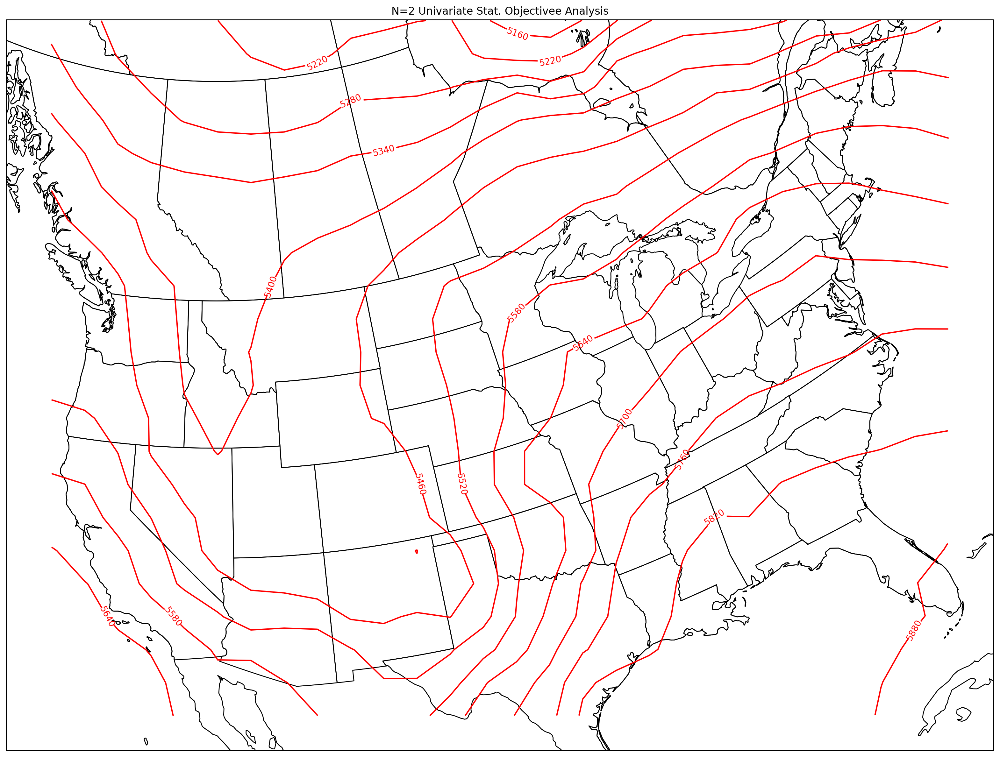

In [22]:
#Plot N=2
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_array[:,:,0], colors = 'red', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('N=2 Univariate Stat. Objectivee Analysis')
plt.savefig('N=2 Univariate SOA')
plt.show()

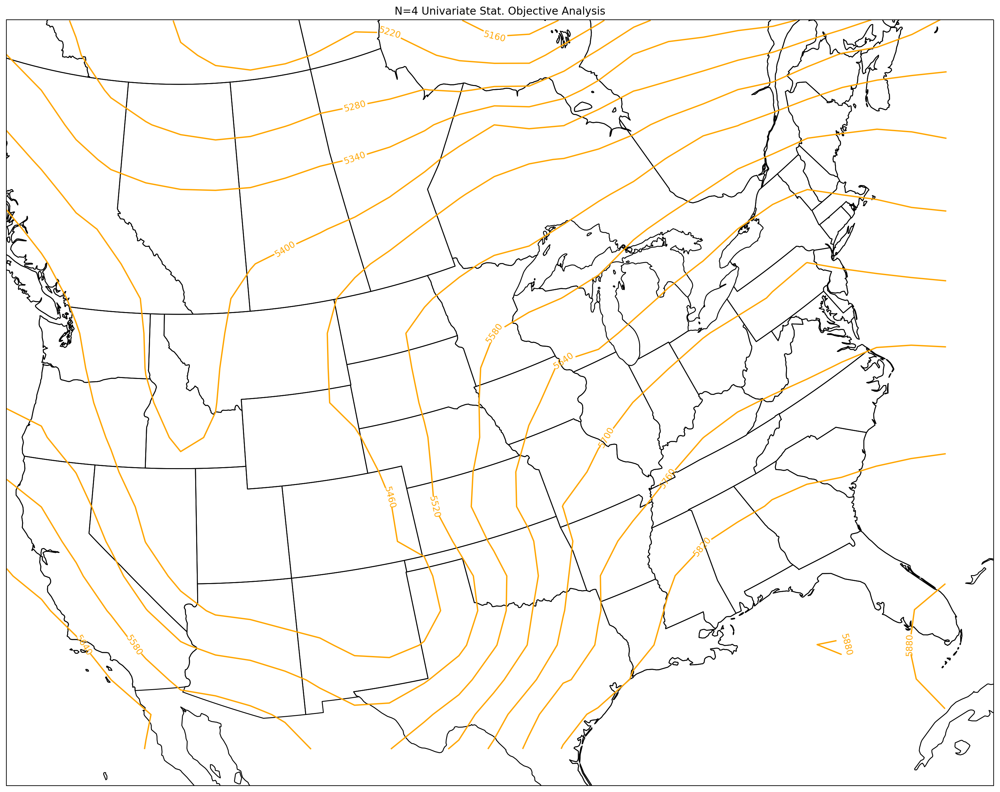

In [23]:
#Plot N=4
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_array[:,:,1], colors = 'orange', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('N=4 Univariate Stat. Objective Analysis')
plt.savefig('N=4 Univariate SOA')
plt.show()

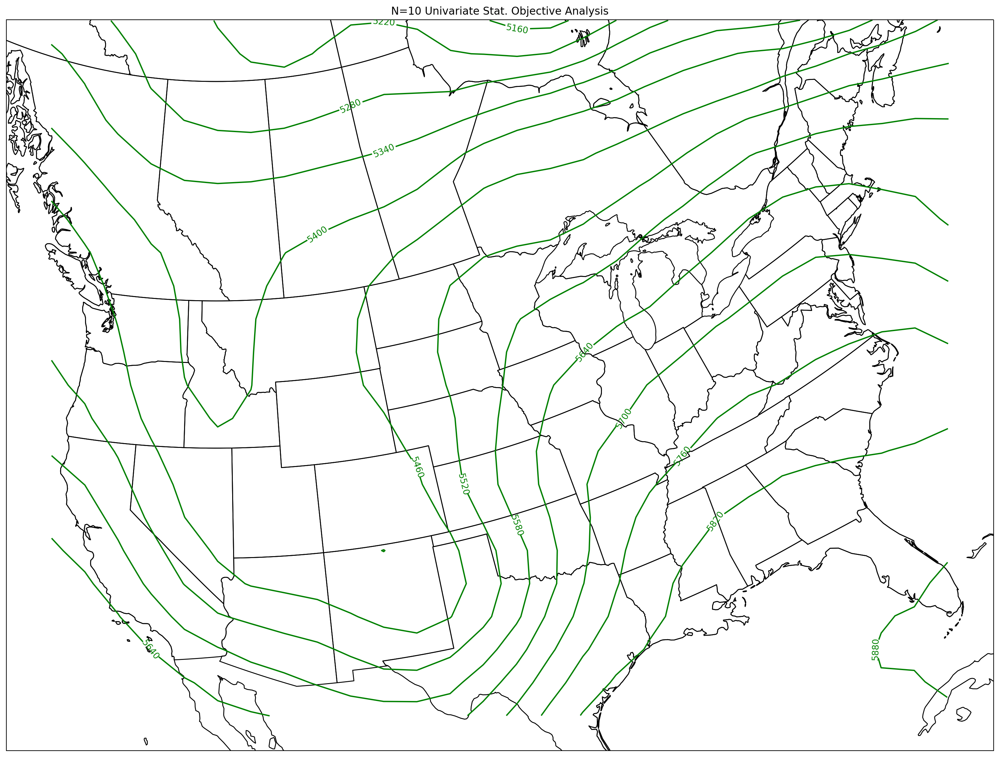

In [24]:
#Plot N=10
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_array[:,:,2], colors = 'green', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('N=10 Univariate Stat. Objective Analysis')
plt.savefig('N=10 Univariate SOA')
plt.show()

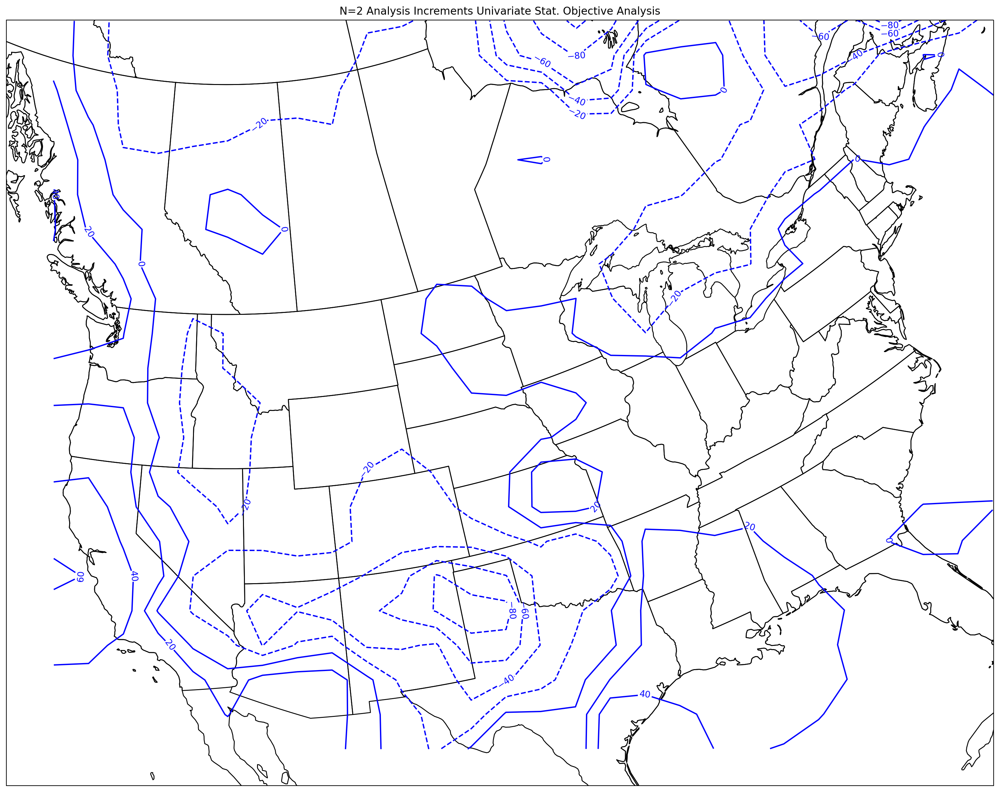

In [25]:
#Plot Analysis Increments N=2
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_increments[:,:,0], colors = 'blue', levels = np.arange(-500,500,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-500,500,20))
plt.title('N=2 Analysis Increments Univariate Stat. Objective Analysis')
plt.savefig('N=2 Analysis Increments SOA')
plt.show()

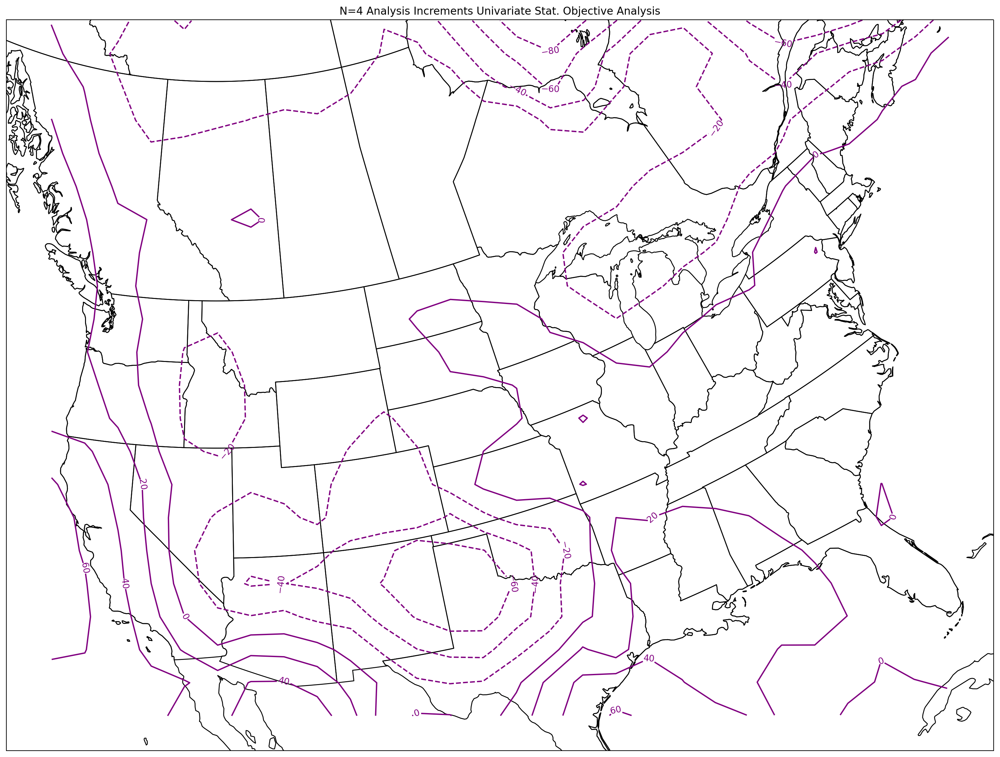

In [26]:
#Plot Analysis Increments N=4
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_increments[:,:,1], colors = 'purple', levels = np.arange(-500,500,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-500,500,20))
plt.title('N=4 Analysis Increments Univariate Stat. Objective Analysis')
plt.savefig('N=4 Analysis Increments SOA')
plt.show()

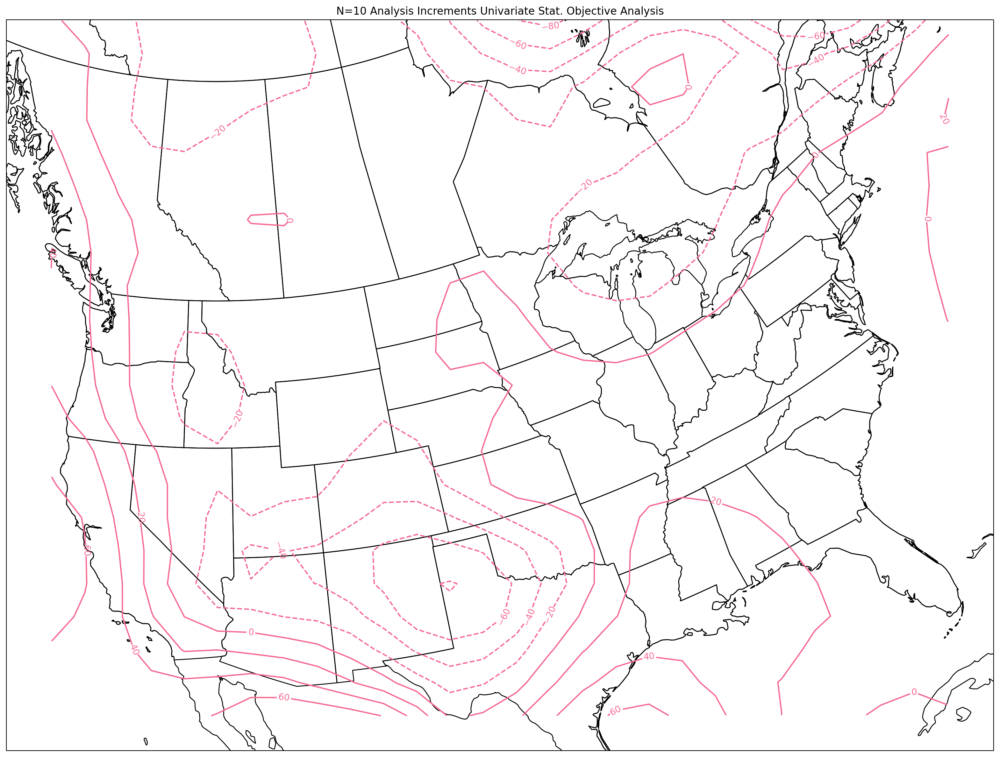

In [27]:
#Plot Analysis Increments N=10
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

cs1 = ax1.contour(x2lon, y2lat, analysis_increments[:,:,2], colors = '#f56991', levels = np.arange(-500,500,20), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(-500,500,20))
plt.title('N=10 Analysis Increments Univariate Stat. Objective Analysis')
plt.savefig('N=10 Analysis Increments SOA')
plt.show()

In [28]:
#Write out analysis values, analysis increments, and analysis differences for each N for each point to the file
with open('Kern_SOA_N_2.txt', 'w+') as f:
    f.write('gridpoints, analysis_value, analysis_increment\n')
    for i in range(len(xx)):
        for j in range(len(xx[0])):
            gridpoints = str([i,j])
            analysis_value = str(analysis_array[i,j,0])
            analysis_increment = str(analysis_increments[i,j,0])
            string = gridpoints + ',' + analysis_value + ',' + analysis_increment + '\n'
            f.write(string)

In [29]:
#Write out analysis values, analysis increments, and analysis differences for each N for each point to the file
with open('Kern_SOA_N_4.txt', 'w+') as f:
    f.write('gridpoints, analysis_value, analysis_increment\n')
    for i in range(len(xx)):
        for j in range(len(xx[0])):
            gridpoints = str([i,j])
            analysis_value = str(analysis_array[i,j,1])
            analysis_increment = str(analysis_increments[i,j,1])
            string = gridpoints + ',' + analysis_value + ',' + analysis_increment + '\n'
            f.write(string)

In [30]:
#Write out analysis values, analysis increments, and analysis differences for each N for each point to the file
with open('Kern_SOA_N_10.txt', 'w+') as f:
    f.write('gridpoints, analysis_value, analysis_increment\n')
    for i in range(len(xx)):
        for j in range(len(xx[0])):
            gridpoints = str([i,j])
            analysis_value = str(analysis_array[i,j,2])
            analysis_increment = str(analysis_increments[i,j,2])
            string = gridpoints + ',' + analysis_value + ',' + analysis_increment + '\n'
            f.write(string)

In [31]:
#Write out analysis values, analysis increments, and analysis differences for each N for each point to the file
with open('Kern_SOA_differences.txt', 'w+') as f:
    f.write('observation_point, N, analysis_diffs\n')
    for n in range(len(n_vals)):
        num_N = n_vals[n]
        for i in range(len(heights_500mb)):
            observation_point = str(i)
            analysis_diffs = str(analysis_difference[i,n])
            string = observation_point + ',' + str(num_N) + ',' + analysis_diffs + '\n'
            f.write(out_string)
        

In [468]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.

    We are still able to see a large trough over the western United States and a ridge situated over the eastern United States.
    Still looks like flow that would result in formation of a Colorado Low.

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    
    The smoothest plot is definitely N=10, the other plots, especially N=2 look to be jagged and not smooth countours. N=4
    is still not as smooth as N=10. This is likely because there are more points being included in the analysis. Less points
    being considered in the analysis equals a more jagged/not smooth contour with only 2 or 4 other obs being used in analysis.
    N=4 allows us to see smaller scale features better where N=10 is very smooth. N=2 is needs to be more smooth and is harder
    to tell what is occuring in terms of smaller scale features.
    

3 - What happens as you increase the number of points considered for the analysis?  Is this 
    desirable?  Why or why not?
    
    As you increase the number of points being considered, the more smooth the analysis and contours become. N=2 is way to jagged 
    and more points are needed to be considered in the analysis. N=4 we are able to see more features, like smaller scale features a bit better 
    and it isn't too smooth to the point where we cannot identify the smaller scale features. Additionally, we are still able to see larger scale
    features well. N=10 is very smoothed out and we cannot see the smaller scale features at all, only larger scale. It depends on 
    what type of features you are trying to analyze. Large scale feature, you should use N=10. Small scale features, N=4.
'''

'\n1 - Describe the general features that you see in your contoured analyses.\n    \n\n2 - Describe the differences that you see in your contoured analyses.  \n    Does one analysis seem to be smoother than the other?  If so, what would cause this?\n    \n\n3 - What happens as you increase the number of points considered for the analysis?  Is this \n    desirable?  Why or why not?\n    \n'